In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!cd /content/drive/MyDrive/new_project

In [ ]:
!pip install ultralytics

In [17]:
import tensorflow as tf

import os
import pathlib
import time
import datetime
import glob
import shutil
import cv2
import numpy as np
import random
from ultralytics import YOLO

from matplotlib import pyplot as plt
from IPython import display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
images = glob.glob('/content/drive/MyDrive/new_project/data/nose_x/*.png')
labels = glob.glob('/content/drive/MyDrive/new_project/data/nose_y/*.png')

In [5]:
k = len(images)//6


In [ ]:
train_imgs = images[k:]
train_labels = labels[k:]

test_imgs = images[:k]
test_labels = labels[:k]

In [ ]:
len(train_imgs),len(train_labels),len(test_imgs),len(test_labels)

(577, 577, 115, 115)

In [ ]:
os.mkdir('/content/drive/MyDrive/new_project/dataset')
os.mkdir('/content/drive/MyDrive/new_project/dataset/train_images')
os.mkdir('/content/drive/MyDrive/new_project/dataset/train_images/images')
os.mkdir('/content/drive/MyDrive/new_project/dataset/valid_images')
os.mkdir('/content/drive/MyDrive/new_project/dataset/valid_images/images')
os.mkdir('/content/drive/MyDrive/new_project/dataset/train_labels')
os.mkdir('/content/drive/MyDrive/new_project/dataset/train_labels/images')
os.mkdir('/content/drive/MyDrive/new_project/dataset/valid_labels')
os.mkdir('/content/drive/MyDrive/new_project/dataset/valid_labels/images')

In [ ]:
def copy2(arr,folder):
  for path in arr:
    shutil.copy2(path,folder)


In [ ]:
copy2(train_imgs,'/content/drive/MyDrive/new_project/dataset/train_images/images')
copy2(train_labels,'/content/drive/MyDrive/new_project/dataset/train_labels/images')
copy2(test_imgs,'/content/drive/MyDrive/new_project/dataset/valid_images/images')
copy2(test_labels,'/content/drive/MyDrive/new_project/dataset/valid_labels/images')

In [ ]:
sample_image = tf.io.read_file(str('/content/drive/MyDrive/new_project/dataset/train_images/images/img_811.png'))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(197, 167, 3)


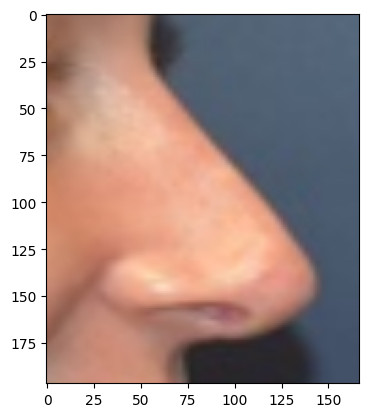

In [ ]:
plt.figure()
plt.imshow(sample_image)

In [4]:
def load(input_img):
  output = tf.strings.regex_replace(input_img, '_images', '_labels')
  output = tf.strings.regex_replace(output, 'img', 'mask')
  # Read and decode an image file to a uint8 tensor
  input_image = tf.io.read_file(input_img)
  input_image = tf.io.decode_jpeg(input_image)

  output = tf.io.read_file(output)
  output = tf.io.decode_jpeg(output)

  input_image = tf.cast(input_image, tf.float32)
  output = tf.cast(output, tf.float32)


  return input_image, output

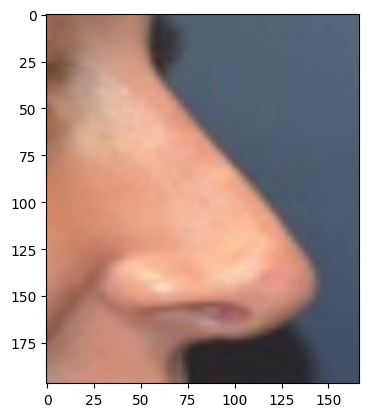

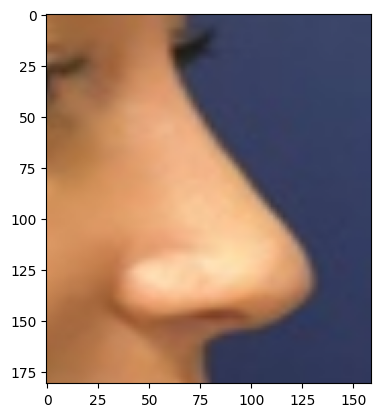

In [5]:
inp, re = load(str('/content/drive/MyDrive/UFAZ_Capstone_project/dataset/train_images/images/img_811.png'))
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

In [6]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [7]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [8]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [9]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [10]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

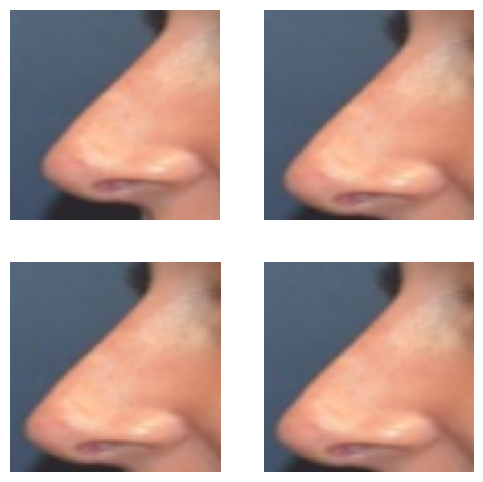

In [11]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [12]:
def load_image_train(image_file):
  # print(image_file)
  # output_file = str(image_file.replace('nose_x', 'nose_y').replace('img', 'mask'))
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [13]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [14]:
train_dataset = tf.data.Dataset.list_files(str('/content/drive/MyDrive/UFAZ_Capstone_project/dataset/train_images/images/*.png'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [15]:
test_dataset = tf.data.Dataset.list_files(str('/content/drive/MyDrive/UFAZ_Capstone_project/dataset/valid_images/images/*.png'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [19]:
example_input, example_target = next(iter(test_dataset.take(12)))

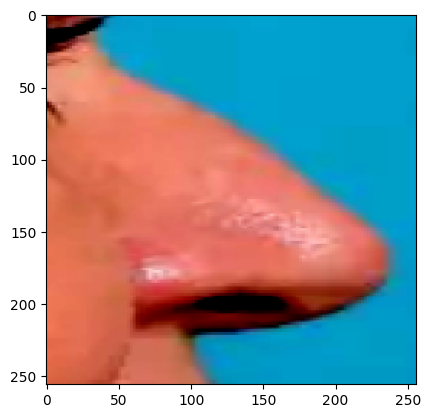

In [20]:
plt.imshow(example_input[0])

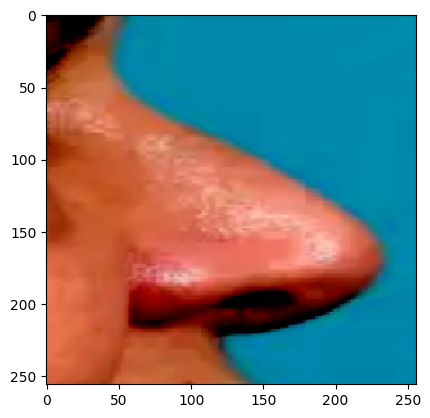

In [21]:
plt.imshow(example_target[0])

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 99, 84, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 198, 168, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

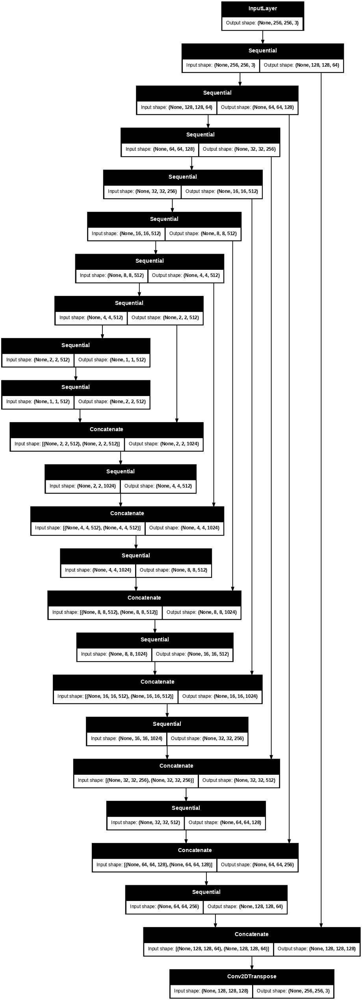

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

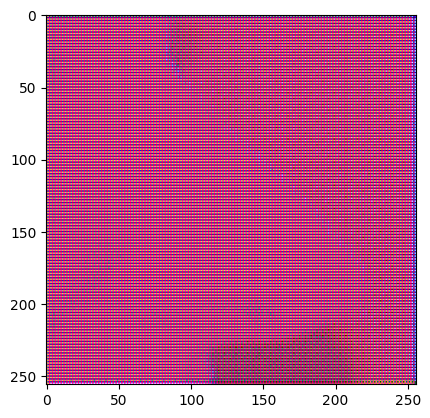

In [ ]:
import tensorflow as tf

# Assuming 'inp' is your input image tensor
inp = tf.image.resize(inp, [256, 256])

gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

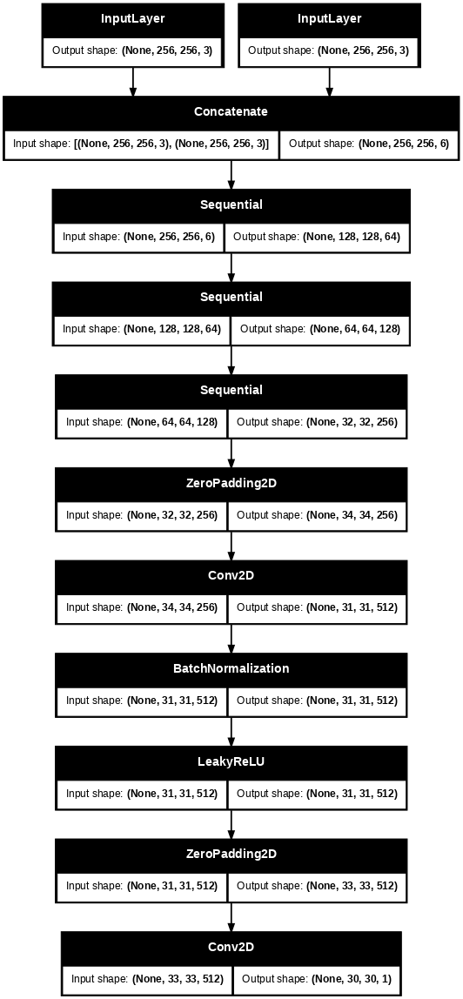

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

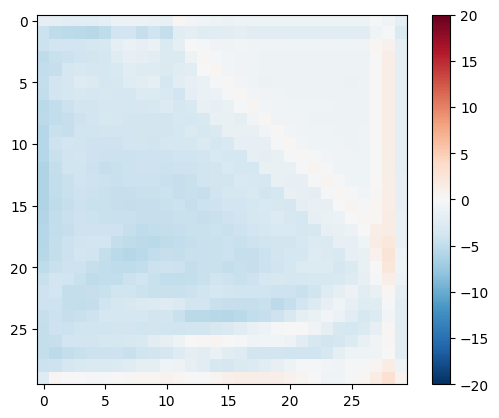

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [22]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

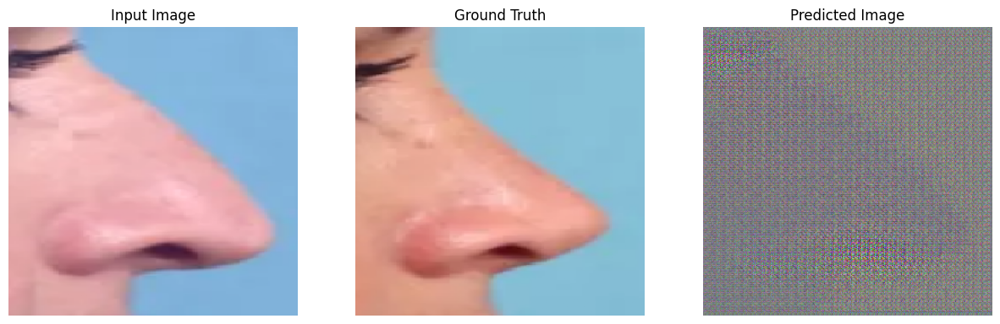

In [ ]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

Output hidden; open in https://colab.research.google.com to view.

Time taken for 1000 steps: 118.50 sec



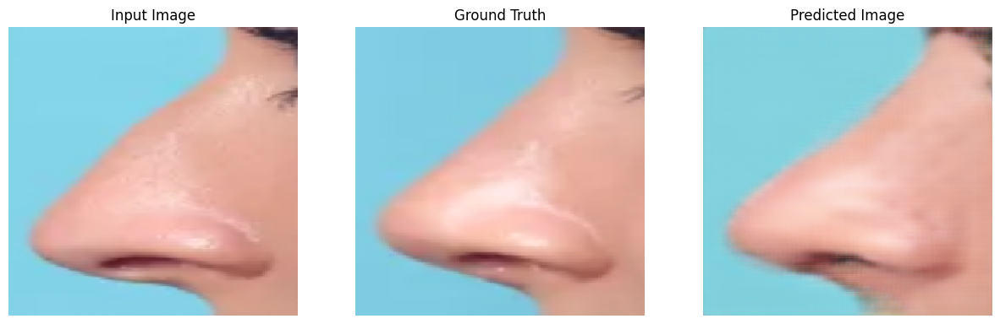

Step: 39k
....................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
generator.save('/content/drive/MyDrive/new_project/model/model.keras')

In [ ]:
!ls {checkpoint_dir}

checkpoint		    ckpt-3.index		ckpt-6.index
ckpt-1.data-00000-of-00001  ckpt-4.data-00000-of-00001	ckpt-7.data-00000-of-00001
ckpt-1.index		    ckpt-4.index		ckpt-7.index
ckpt-2.data-00000-of-00001  ckpt-5.data-00000-of-00001	ckpt-8.data-00000-of-00001
ckpt-2.index		    ckpt-5.index		ckpt-8.index
ckpt-3.data-00000-of-00001  ckpt-6.data-00000-of-00001


In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

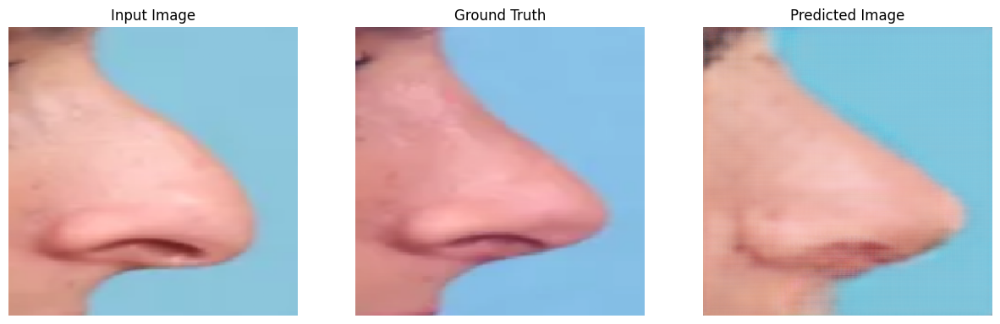

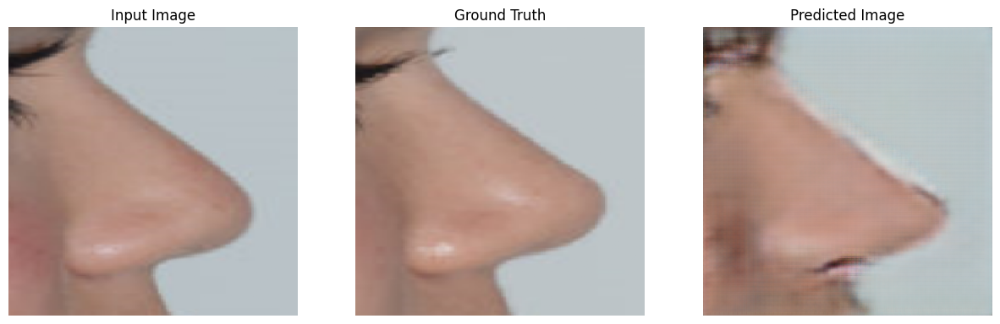

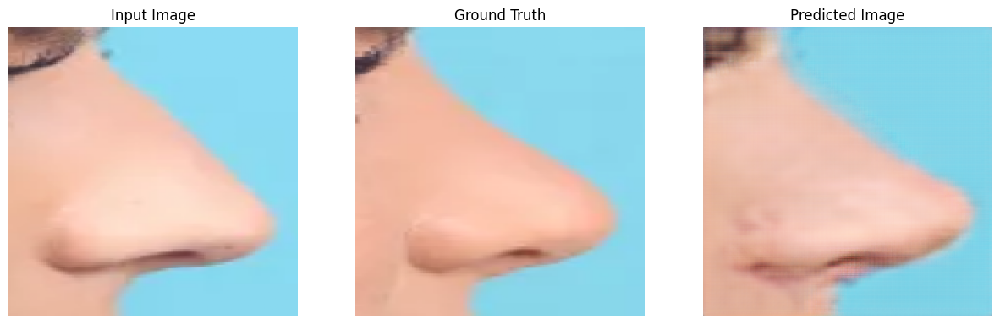

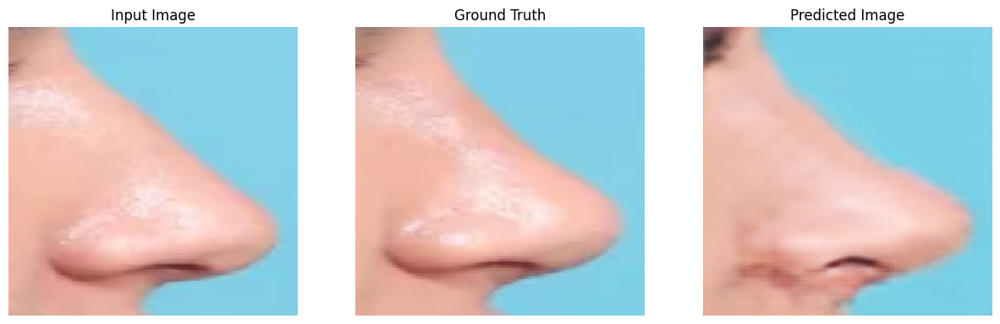

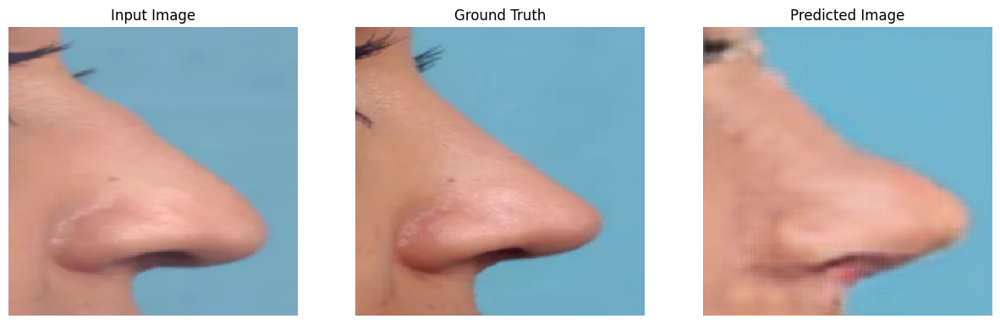

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [23]:
pred_img,lab = next(iter(test_dataset.take(41)))

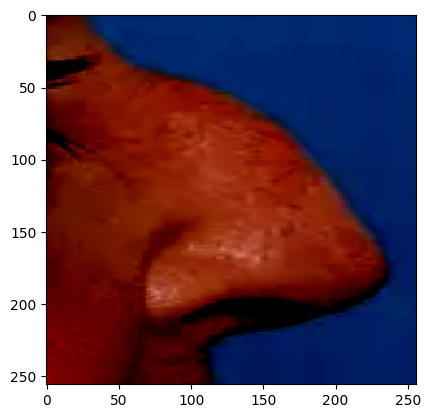

In [24]:
plt.imshow(pred_img[0])

In [19]:
gen = tf.keras.models.load_model('/content/drive/MyDrive/new_project/model/model.keras')

In [20]:
def predict_images(model, test_input):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [24]:
pred_img,lab = next(iter(test_dataset.take(178)))

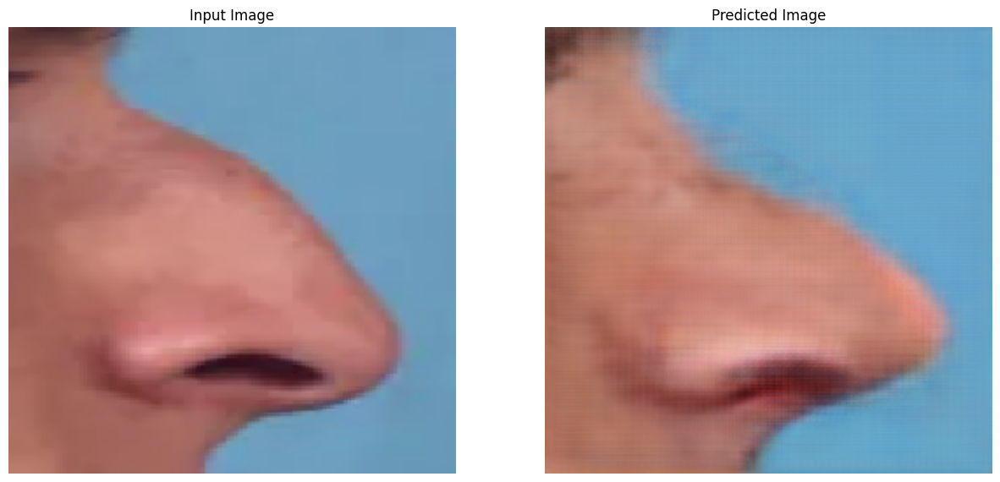

In [29]:
predict_images(gen,pred_img)

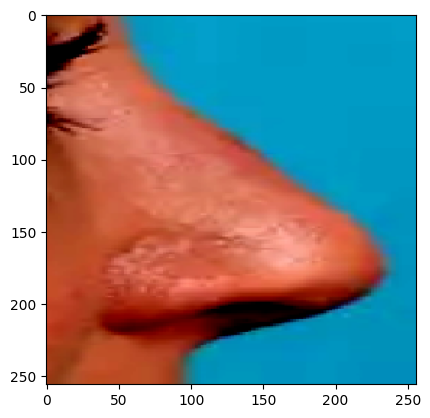

In [63]:
plt.imshow(lab[0])

In [155]:
def predict_custom_image(image,model):
  yolo = YOLO('/content/drive/MyDrive/new_project/model/model.pt')
  results = yolo.predict(image)
  coor = results[0].boxes.xyxy

  arr = image
  coors = coor[0]
  x1 = int(float(coors[0]))
  y1 = int((float(coors[1])) )
  x2 = int((float(coors[2])) )
  y2 = int((float(coors[3])) )



  new_arr = arr[y1:y2,x1:x2]

  resized_arr = cv2.resize(new_arr,(256,256))
  expanded_arr = np.expand_dims(resized_arr,axis = 0)
  normalized = (expanded_arr/127.5) - 1
  predict_images(model,normalized)
  prediction = model(normalized,training=True)
  print(new_arr.shape,prediction[0].shape)
  # print(prediction)
  plt.imshow(prediction[0]*0.5+0.5)
  plt.show()
  pred = cv2.resize(np.array(prediction[0]),(new_arr.shape[1],new_arr.shape[0]))
  print(new_arr.shape,pred.shape)
  plt.imshow(pred*0.5+0.5)
  plt.show()
  print(arr[y1:y2, x1:x2].shape)
  arr = ((arr/127.5)-1)*0.5+0.5
  arr[y1:y2,x1:x2] = pred*0.5+0.5
  plt.imshow(arr)

In [54]:
img_path = '/content/drive/MyDrive/new_project/custom_images/elsever.png'

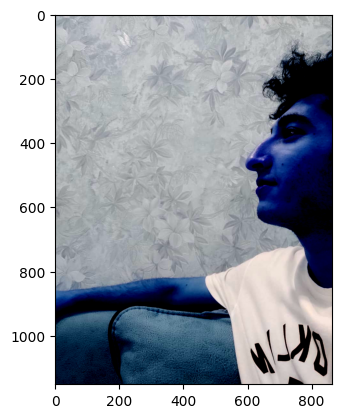

In [156]:
img = cv2.imread(img_path)
plt.imshow((img/127.5)-1)


0: 640x480 1 nose, 10.0ms
Speed: 4.7ms preprocess, 10.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)


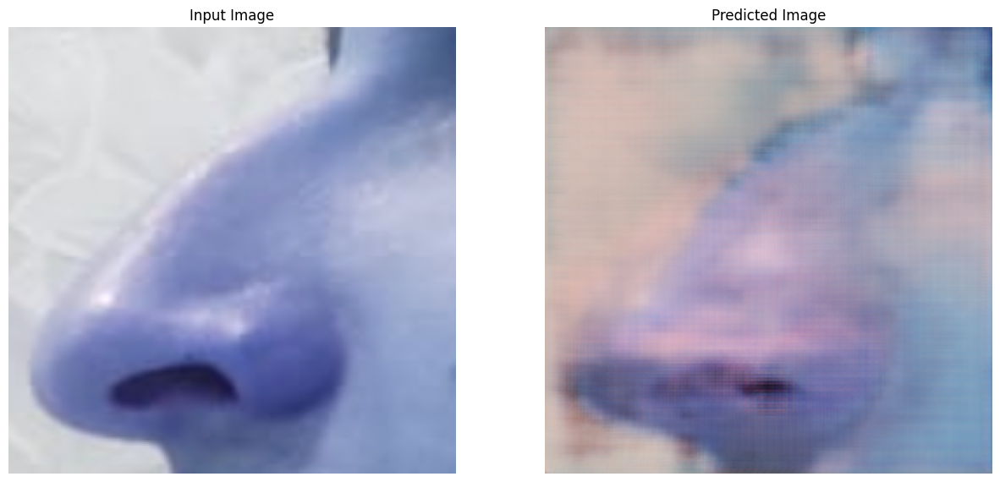

(138, 120, 3) (256, 256, 3)


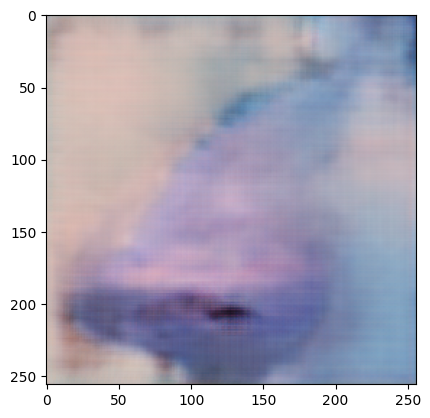

(138, 120, 3) (138, 120, 3)


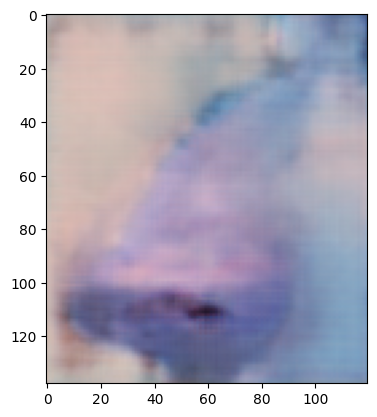

(138, 120, 3)


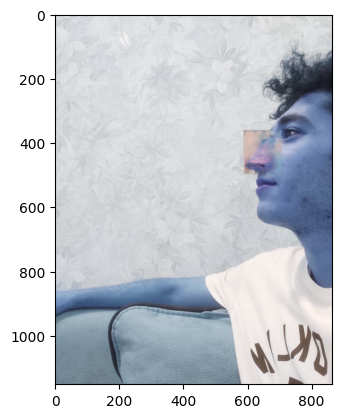

In [157]:
predict_custom_image(img,gen)


0: 640x608 1 nose, 66.2ms
Speed: 3.1ms preprocess, 66.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 608)


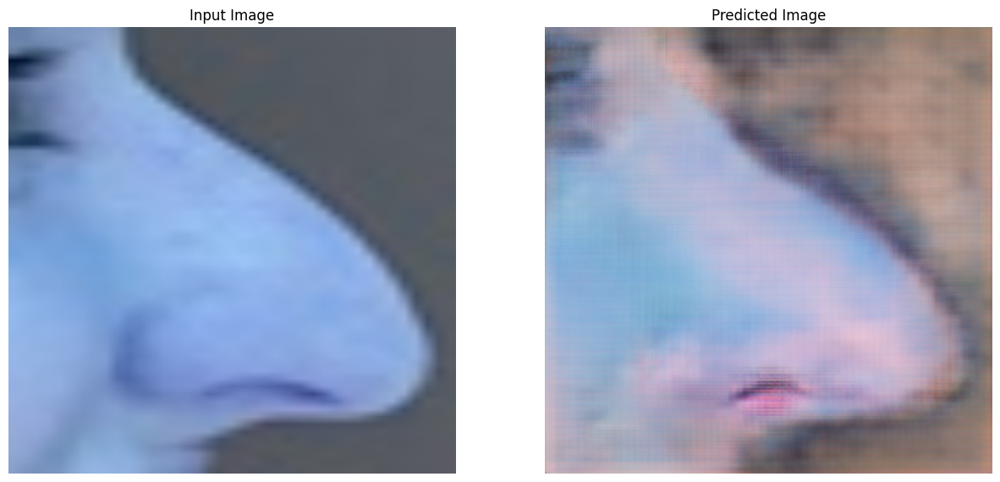

(59, 39, 3) (256, 256, 3)


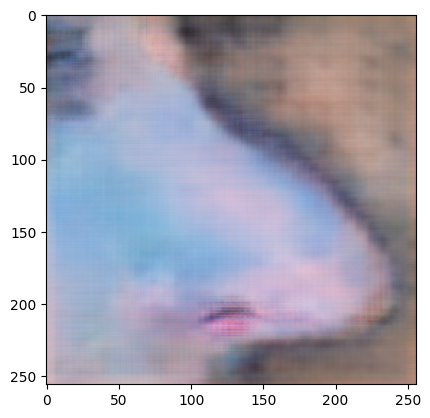

(59, 39, 3) (59, 39, 3)


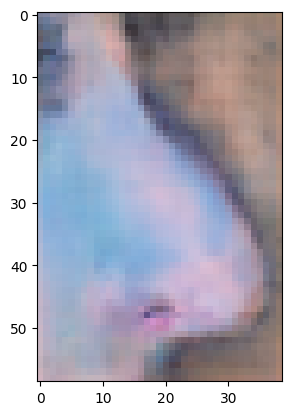

(59, 39, 3)


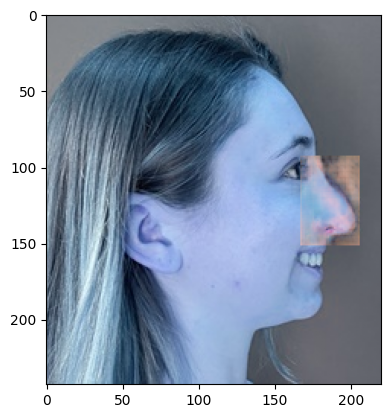

In [158]:
predict_custom_image(cv2.imread('/content/drive/MyDrive/new_project/custom_images/custom_image_1.png'),gen)


0: 640x448 1 nose, 63.6ms
Speed: 2.4ms preprocess, 63.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 448)


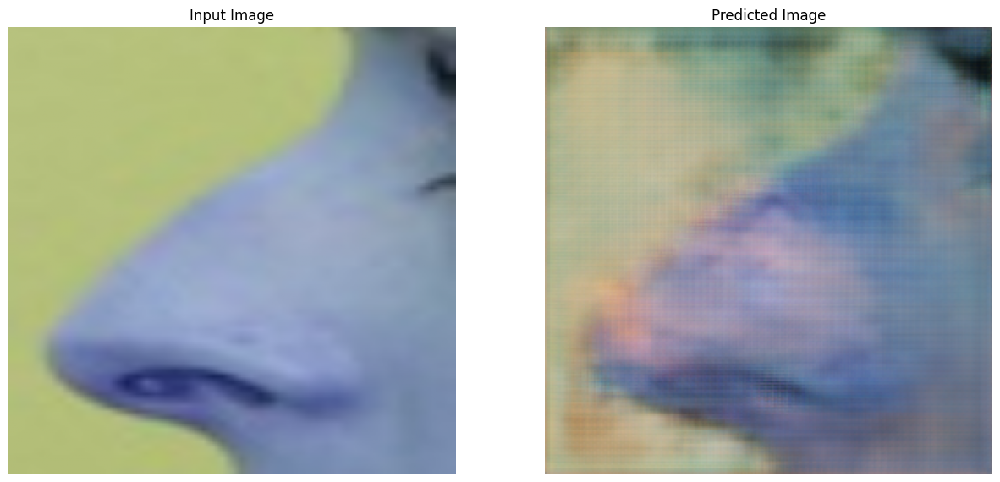

(76, 47, 3) (256, 256, 3)


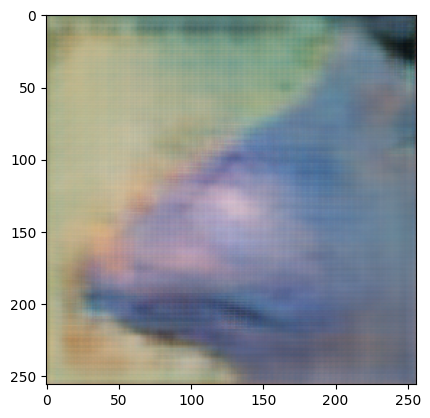

(76, 47, 3) (76, 47, 3)


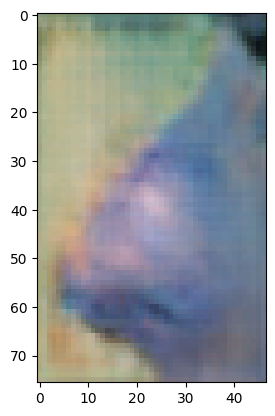

(76, 47, 3)


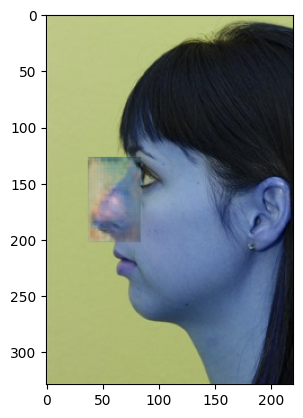

In [159]:
predict_custom_image(cv2.imread('/content/drive/MyDrive/new_project/custom_images/custom_image_2.png'),gen)


0: 640x448 1 nose, 22.6ms
Speed: 2.4ms preprocess, 22.6ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 448)


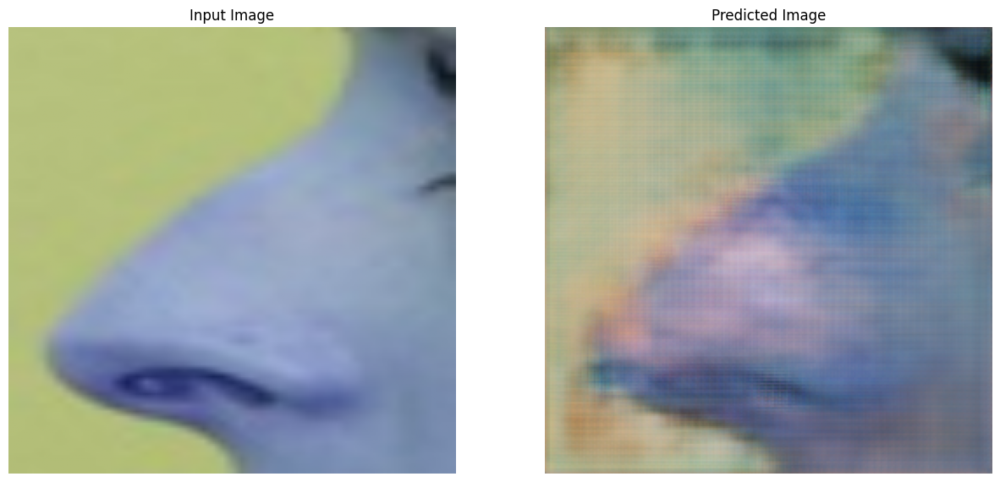

(76, 47, 3) (256, 256, 3)


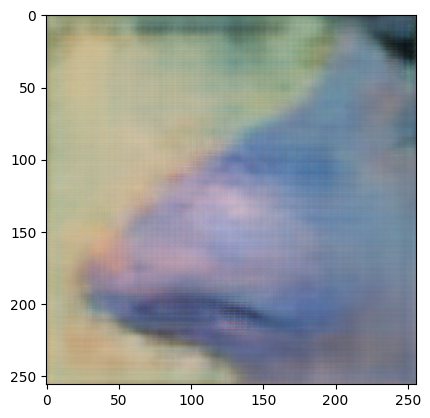

(76, 47, 3) (76, 47, 3)


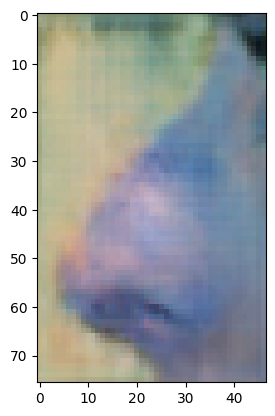

(76, 47, 3)


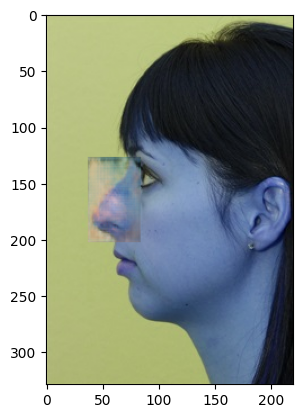

In [160]:
predict_custom_image(cv2.imread('/content/drive/MyDrive/new_project/custom_images/custom_image_2.png'),gen)


0: 640x448 1 nose, 7.0ms
Speed: 1.8ms preprocess, 7.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)


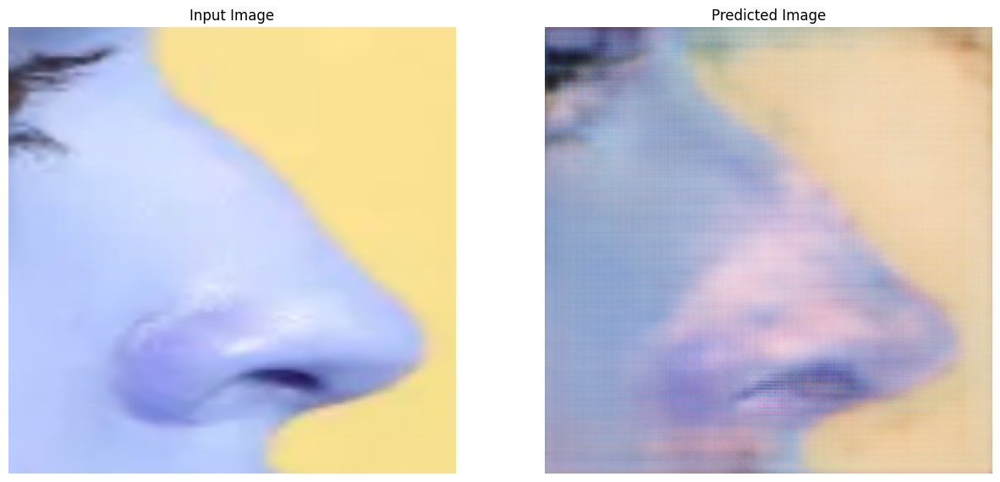

(116, 68, 3) (256, 256, 3)


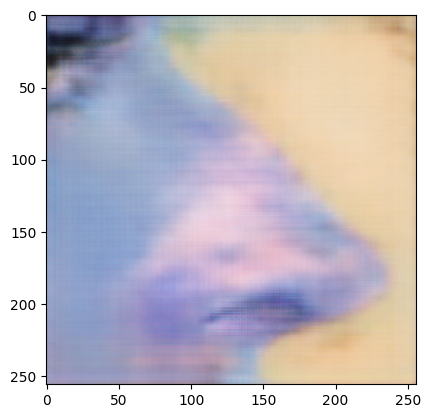

(116, 68, 3) (116, 68, 3)


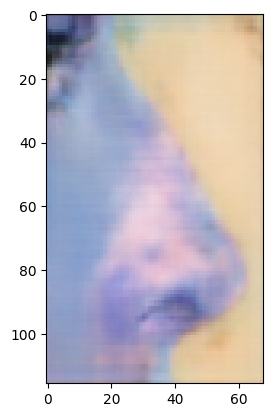

(116, 68, 3)


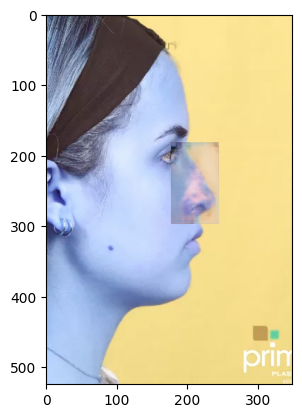

In [162]:
predict_custom_image(cv2.imread('/content/drive/MyDrive/new_project/custom_images/custom_image_4.png'),gen)